In [1]:
import numpy as np
import pygmt
import pandas as pd
from glob import glob
import tqdm as tqdm
import obspy
from obspy.clients.fdsn import Client
import matplotlib.pyplot as plt


from scipy.interpolate import griddata as gd
import cartopy as cart
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.crs as ccrs
import cartopy.io.img_tiles as cigmt

In [2]:
cd ..

/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks


In [3]:
files = glob('/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/*')
files

['/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/task2.docx',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/uuss_ysn.final.2021.pdf',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/yellake.map',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Task_2b_Akash.odt',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/YELLOWSTONEeq.catalog',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Yellowstone_seismicity_map.png',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/Task_2a_Akash.odt',
 '/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/yell.border.g']

In [4]:
eq_cat_file = glob('/home/aakash/Desktop/Reference_Papers/Keith_Koper/Tasks/Task_2/*')[4]
ev_lats_ddm = pd.read_csv(eq_cat_file,names=['Lat_Degree','Lat_Minute'],skipinitialspace=True,sep=' ',usecols=[3,4],engine='python')
ev_lats =  ev_lats_ddm.values[:,0]+(ev_lats_ddm.values[:,1])/60
ev_lons_ddm = pd.read_csv(eq_cat_file,names=['Lon_Degree','Lon_Minute'],skipinitialspace=True,sep=' ',usecols=[5,6])
ev_lons =  (ev_lons_ddm.values[:,0]+(ev_lons_ddm.values[:,1])/60)*(-1)

In [5]:
magnitude = pd.read_csv(eq_cat_file,names=['Mag1','Mag2'],skipinitialspace=True,sep=' ',usecols=[8,9])
magnitude

,Mag1,Mag2
0,2.90,8.00
1,1.12,5.00
2,1.42,6.00
3,0.28,7.00
4,1.70,9.00
...,...,...
54331,W,0.82
54332,-0.61,7.00
54333,-0.28,9.00
54334,W,1.31


In [6]:
mag1 = magnitude.values[:,0]
mag2 = magnitude.values[:,1]

In [7]:
for i in range(len(mag1)):
    if mag1[i] == 'W':
        mag1[i] = mag2[i]
        
    if mag1[i] == 'M':
        mag1[i] = mag2[i]

In [8]:
mag1 = np.array(mag1).astype('float')

In [9]:
## Yellowstone Lake
yellake = pd.read_csv(files[2],header=None,sep=" ")
yellake_lats = yellake.values[:,1]
yellake_lons = yellake.values[:,0]
## Yellowstone Park
yelpark = pd.read_csv(files[7],skiprows = [0,1001],header=None,sep=" ")
yelpark_lats = np.array(yelpark.values[:,1])
yelpark_lons = np.array(yelpark.values[:,0])

yellpark_lons = []
yellpark_lats = []

for i in range(len(yelpark_lats)):
    if yelpark_lons[i] != 's':
        yellpark_lons.append(yelpark_lons[i])
        yellpark_lats.append(yelpark_lats[i])
        
yellpark_lons = np.array(yellpark_lons).astype('float')

In [10]:
depths_total = pd.read_csv(eq_cat_file,names=['Depth'],skipinitialspace=True,sep=' ',usecols=[7])
depths_before_2012 = depths_total.values[0:39003,0]
depths_after_2012 = depths_total.values[39003:-1,0]
depths = depths_total.values[:,0]

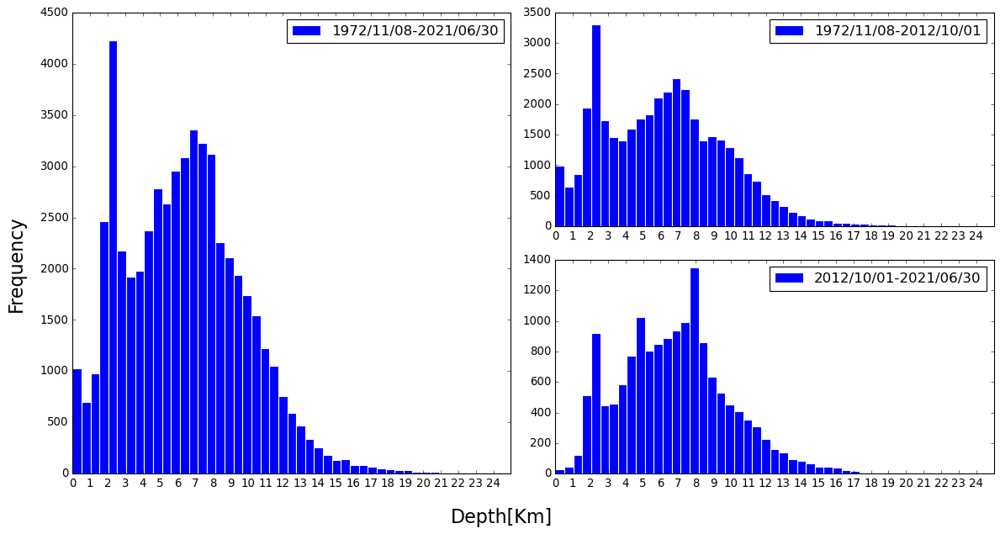

In [11]:
plt.style.use('classic')
import matplotlib.pyplot as plt
bins = np.linspace(0,25,50)

fig = plt.figure(figsize=[15,8],facecolor='white')


ax1 = plt.subplot2grid(shape=(2,2),loc=(0,0),rowspan=2)
ax1.hist(depths_total,bins=bins, histtype='bar',stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='1972/11/08-2021/06/30')
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)

ax1 = plt.subplot2grid(shape=(2,2),loc=(0,1),colspan=1)
ax1.hist(depths_before_2012,bins=bins, histtype='bar',stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='1972/11/08-2012/10/01')
#plt.hist(depths,bins=bins, histtype='bar',stacked=True,rwidth=0.8,cumulative=True)
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)

ax1 = plt.subplot2grid(shape=(2,2),loc=(1,1),colspan=1)
ax1.hist(depths_after_2012,bins=bins, histtype='bar',stacked=True,rwidth=1,cumulative=False,edgecolor='white',label='2012/10/01-2021/06/30')
#plt.hist(depths,bins=bins, histtype='bar',stacked=True,rwidth=0.8,cumulative=True)
ax1.set_xticks(np.arange(0,25,1))
ax1.legend(fontsize=15)
fig.supylabel('Frequency',x=0.01,fontsize=20)
fig.supxlabel('Depth[Km]',y=0.01,fontsize=20)
fig.tight_layout()
plt.show()

Depth above which 90% of the earthquakes occur: 10.8099716199Km
Depth above which 90% of the earthquakes occur: 12.1599743199Km


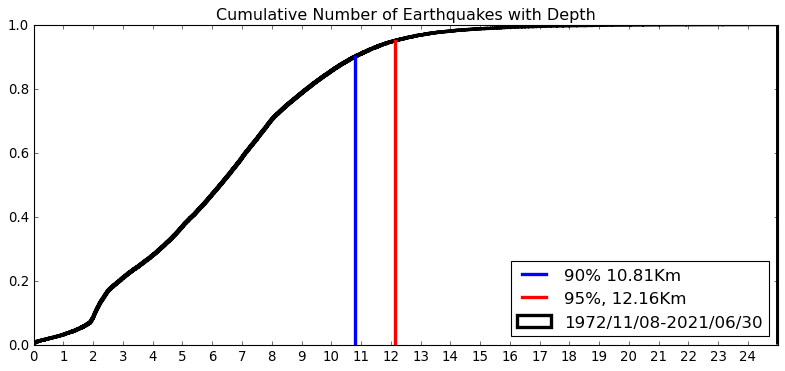

In [12]:
plt.style.use('classic')
import matplotlib.pyplot as plt
bins = np.linspace(0,25,500000)

fig = plt.figure(figsize=[12,5],facecolor='white')


ax1 = plt.subplot2grid(shape=(1,1),loc=(0,0),rowspan=1)
a = ax1.hist(depths_total,bins=bins, histtype='step',stacked=True,rwidth=1,color='black',density=True,
         cumulative=True,edgecolor='black',label='1972/11/08-2021/06/30',linewidth = 3)
ax1.set_xticks(np.arange(0,25,1))


print('Depth above which 90% of the earthquakes occur: '+ str(a[1][0:-1][a[0] >= 0.9][0])+'Km')
print('Depth above which 90% of the earthquakes occur: '+ str(a[1][0:-1][a[0] >= 0.95][0])+'Km')

#ax1.axhline(0.9,xmax = 10.80,lw = 3,label = '90%')
ax1.axvline(10.80,ymax=0.9,lw = 3,label = '90% 10.81Km')
#ax1.axhline(0.95,xmax=12.16,lw = 3,label = '95%',color='red')
ax1.axvline(12.15,ymax=0.95,lw = 3,color='red',label = '95%, 12.16Km')
ax1.legend(fontsize=15,loc='lower right')
ax1.set_title('Cumulative Number of Earthquakes with Depth')
plt.show()

/tmp/ipykernel_897811/3503170818.py:15: FutureWarning: The 'sizes' parameter has been deprecated since v0.4.0 and will be removed in v0.6.0. Please use 'size' instead.
  fig.plot(x=ev_lons,y=ev_lats,sizes = 0.09 * 1.5 **mag1,style='cc',pen='black',region=region,


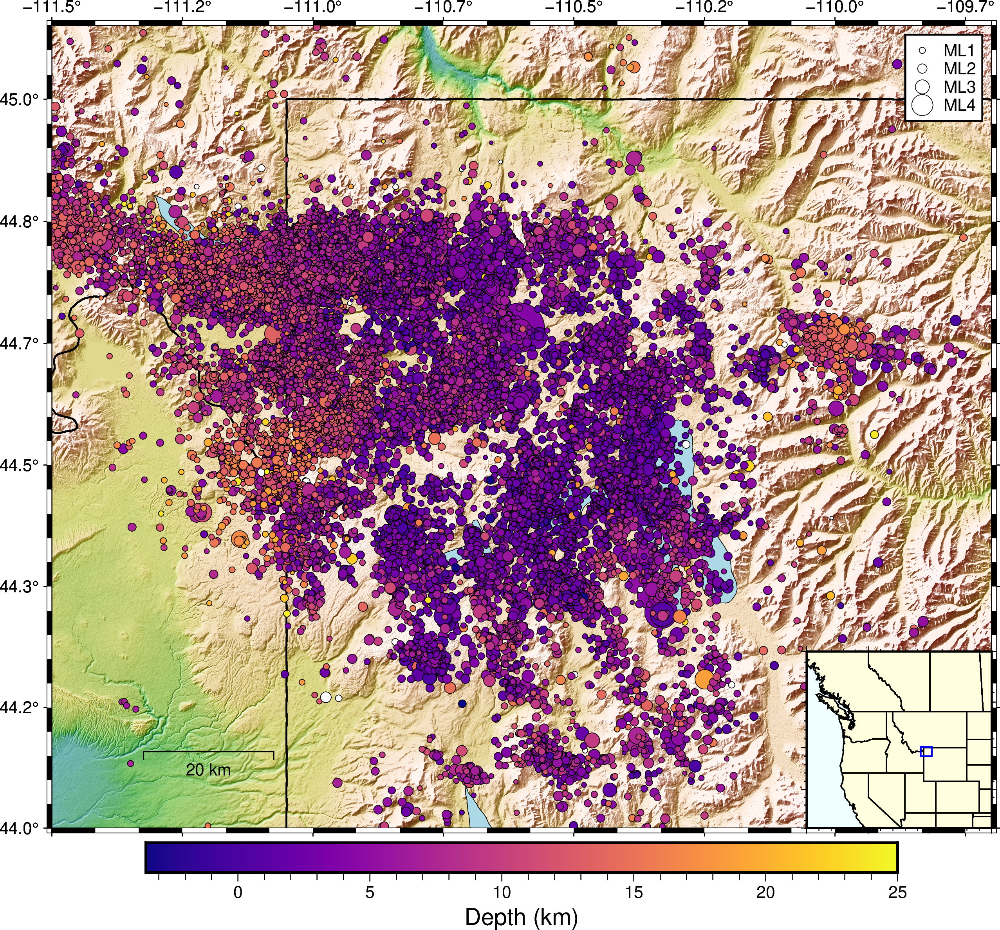

In [19]:
region=[-111.5,-109.7, 44, 45.1]
fig = pygmt.Figure()

## remeber in pygmt, use 'sizes' instead of size
#pygmt.makecpt(cmap='dem2',series='-10000/10000/1000',continuous=True)

topo_data = '@earth_relief_01s'
pygmt.config(FORMAT_GEO_MAP="ddd.x")
fig.grdimage(grid=topo_data,region=region,projection='M8i',shading=True,cmap='topo',
            frame=["WsNe", "xaf", "yaf"])

pygmt.makecpt(cmap="plasma", series=[np.min(depths),25])
fig.coast(shorelines=True,water="lightblue",region=region,borders="2/thick",
         frame=["WsNe", "xaf", "yaf"], map_scale='"g-111.2/44.1+w20"')
fig.plot(x=ev_lons,y=ev_lats,sizes = 0.09 * 1.5 **mag1,style='cc',pen='black',region=region,
        color=depths_total.values[:,0], cmap=True)

fig.plot(x=109,y=40, style='c'+str(0.09 * 1.5 **1)+'c',pen='black',region=region,
        color='white',label='ML1')
fig.plot(x=115,y=40, style='c'+str(0.09 * 1.5 **2)+'c',pen='black',region=region,
        color='white',label='ML2')
fig.plot(x=112,y=40, style='c'+str(0.09 * 1.5 **3)+'c',pen='black',region=region,
        color='white',label='ML3')
fig.plot(x=112,y=40, style='c'+str(0.09 * 1.5 **4)+'c',pen='black',region=region,
        color='white',label='ML4')

fig.colorbar(frame='af+l"Depth (km)"')
#fig.plot(x=yellake_lons,y=yellake_lats,style='c0.08c',color='lightblue',pen='lightblue',region=region)



#fig.text(text=stntexts,y=stnlats+0.01,x=stnlons+0.07,font="6p,Helvetica-Bold,blue")
fig.legend()


with fig.inset(position="jBR+w4c+o-0.0c/-0.0c", box=False,no_clip=True):
    # Plot the Japan main land in the inset using coast. "U54S/?" means UTM
    # projection with map width automatically determined from the inset width.
    # Highlight the Japan area in "lightbrown"
    # and draw its outline with a pen of "0.2p".
    topo_data = '@earth_relief_01m'
    region1 = [-130,-100,35,55]
    proj = "M4c"
    #fig.grdimage(region=region1,projection='"M4c"',shading=True,            
    #             frame=["WsNe", "xaf", "yaf"])
    
    pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain")
    rectangle = [[region[0], region[2], region[1], region[3]]]
    #fig.plot(data=rectangle, style="r+s", pen="2p,blue",projection=proj)
    fig.coast(area_thresh = 10000,
        region=region1,
        projection=proj,
        borders=["2/thin","1/thin"],
        shorelines="thin",
        water="azure1",
        land= 'lightyellow',
        frame=["wsne", "xaf", "yaf"],
        resolution = 'l')
    fig.plot(data=rectangle, style="r+s", pen="1p,blue",projection=proj)
fig.show()

<IPython.core.display.Javascript object>


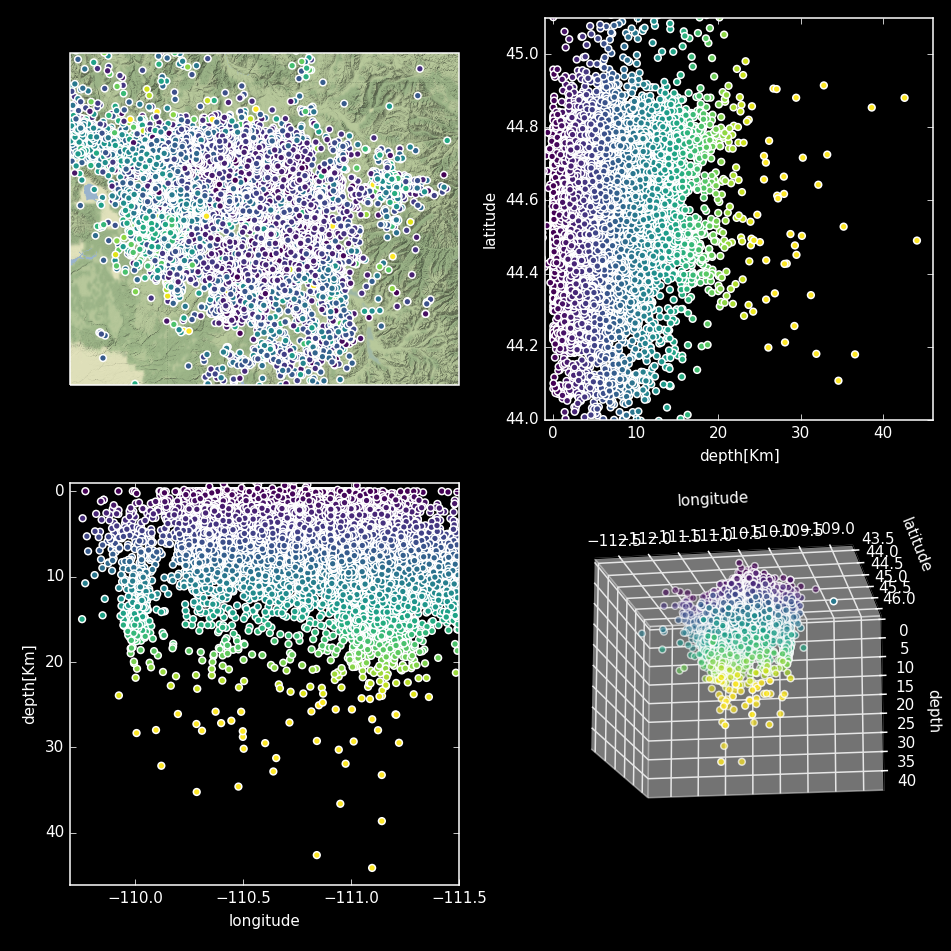

In [24]:
l = len(ev_lats)
%matplotlib notebook
x = ev_lats
y = ev_lons
z = depths_total.values[:,0]
depth = depths_total.values[:,0]
nfr = len(ev_lats)
fps = 20

#mag = np.array(mag).astype('float').reshape(1,l)
x = x.reshape(1,l)[0]
y = y.reshape(1,l)[0]
z = z.reshape(1,l)[0]

fig = plt.figure(figsize = [8,8] )
plt.style.use('dark_background')
ax2 = fig.add_subplot(2, 2, 2)
ax1.set_aspect('auto')
ax1 = fig.add_subplot(2, 2, 1,projection=ccrs.Mercator())
ax1.coastlines()
ax1.set_extent([-111.5,-109.7, 44, 45.1])
stamen_terrain = cigmt.Stamen('terrain-background')
ax1.add_image(stamen_terrain,10)
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4,projection='3d')



ax4.set_xlabel('longitude')
ax4.set_ylabel('latitude')
ax4.set_zlabel('depth')
ax4.set_xlim(min(y)-0.3,max(y)+0.3)
ax4.set_ylim(min(x)-0.3, max(x)+0.3)
ax4.set_zlim(max(depth),0)

ax1.set_xlabel('longitude',transform=ccrs.PlateCarree())
ax1.set_ylabel('latitude',transform=ccrs.PlateCarree())
#ax2.set_xlim(min(y),max(y),transform=ccrs.PlateCarree())
#ax2.set_ylim(min(x),max(x),transform=ccrs.PlateCarree())

ax2.set_xlabel('depth[Km]')
ax2.set_ylabel('latitude')
ax2.set_ylim(44,45.1)
ax2.set_xlim(-1,max(depth)+2)

ax3.set_xlabel('longitude')
ax3.set_ylabel('depth[Km]')
ax3.set_xlim(-109.7,-111.5)
ax3.set_ylim(max(depth)+2, -1)

ax1.ticklabel_format(useOffset=False)
ax2.ticklabel_format(useOffset=False)
ax3.ticklabel_format(useOffset=False)
ax4.ticklabel_format(useOffset=False)



ax4.scatter3D(y,x,z,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25, edgecolor='white')
ax1.scatter(y,x,transform=ccrs.PlateCarree(),marker='o',c=depth,cmap='viridis',vmin=0,vmax=25,edgecolor='white')
ax3_plot = ax2.scatter(depth,x,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25,edgecolor='white')
ax4_plot = ax3.scatter(y,depth,marker='o',c=depth,cmap='viridis',vmin=0,vmax=25,edgecolor='white')

    
    

#ani = animation.FuncAnimation(fig, update, nfr, interval=1, fps = 2000,repeat=False)
#fig.colorbar(ax3_plot, ax=ax2,orientation='vertical',label='Depth[Km]')
#fig.colorbar(ax4_plot, ax=ax3,orientation='horizontal',label='Depth[Km]')
plt.tight_layout()

#FFwriter = animation.FFMpegWriter(fps = 100)
#ani.save('canary_islands.mp4', writer = FFwriter)

In [70]:
n = 25
lon_grid = np.linspace(-111.5, -109.7, n)
lat_grid = np.linspace(44, 45.1, n)

In [71]:
max_depths = np.empty([len(lon_grid),len(lat_grid)])
max_depths[:] = np.nan

In [72]:
max_depths

array([[ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
         nan,  nan,  nan,  nan,  nan,  nan,  nan,  

In [99]:
n = 25
lon_grid = np.linspace(-111.5, -109.7, n)
lat_grid = np.linspace(44, 45.1, n)

max_depths = np.empty([len(lon_grid),len(lat_grid)])
max_depths[:] = np.nan
from tqdm import tqdm
for i in tqdm(range(len(lon_grid)-1)):
    for j in range(len(lon_grid)-1):
        z = []
        for k in range(len(ev_lons)):
                if ev_lons[k] > lon_grid[i] and ev_lons[k] < lon_grid[i+1]:
                    if ev_lats[k] > lat_grid[j] and ev_lats[k] < lat_grid[j+1]:
                        z.append(depths[k])
        if len(z) >= 100:
            a = ax1.hist(z,bins=bins, histtype='step',stacked=True,density=True,
            cumulative=True)
            max_depths[i,j] = a[1][0:-1][a[0] >= 0.95][0]
        

                
       

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:19<00:00,  1.24it/s]


/tmp/ipykernel_897811/1586425786.py:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  ax.pcolormesh(lon_grid, lat_grid,max_depths)


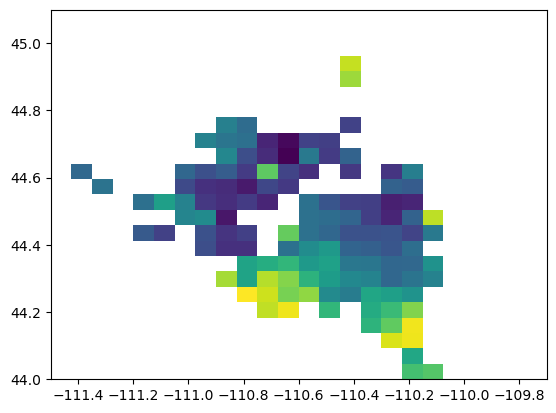

In [93]:
fig = plt.figure()

ax = fig.add_subplot(1,1,1)
ax.pcolormesh(lon_grid, lat_grid,max_depths)

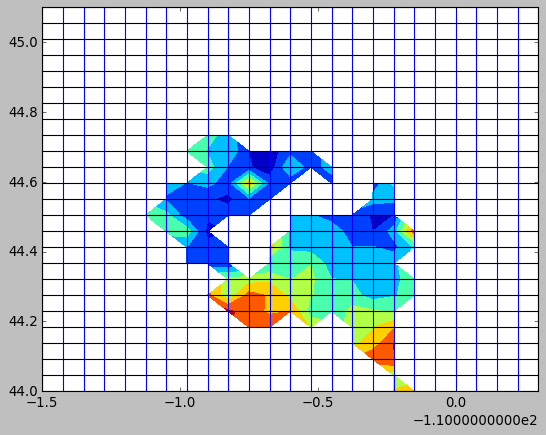

In [37]:
plt.figure()
plt.contourf(lon_grid,lat_grid,max_depths)
for i in range(len(lon_grid)):
    plt.axvline(lon_grid[i])
    
for i in range(len(lat_grid)):
    plt.axhline(lat_grid[i],color='black')

In [28]:
from scipy.interpolate import griddata as gd
import cartopy as cart
import cartopy.crs as ccrs
import cartopy.feature as cfeature

/home/aakash/anaconda3/envs/roses_2021/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolormesh(self, *args, **kwargs)


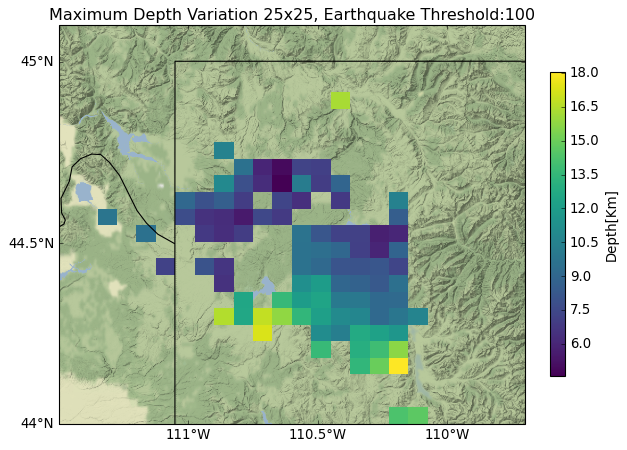

In [101]:
plt.style.use('classic')
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from cartopy.io.img_tiles import Stamen

fig = plt.figure(figsize=[8,8],facecolor='white')
ax2 = fig.add_subplot(1, 1, 1, projection= ccrs.Mercator())
ax2.set_extent([-111.5,-109.7,44,45.1], crs=ccrs.PlateCarree())
ax2.add_feature(cart.feature.OCEAN, zorder=100, edgecolor='k')
#ax2.add_feature(cfeature.LAND)
ax2.add_feature(cfeature.COASTLINE,lw=2)
ax2.coastlines('50m')
#ax2.add_feature(cfeature.OCEAN)
#ax2.add_feature(cfeature.LAKES)
#mappable = ax2.contourf(lon_grid,lat_grid,max_depths,cmap='jet',transform=ccrs.PlateCarree())
#ax2.scatter(ev_lons,ev_lats,c=depths,vmin=np.min(depths),vmax=np.max(depths),cmap='jet',transform=ccrs.PlateCarree(),s=0.08*2**mag1)
#ax2.add_feature(cfeature.OCEAN)
#ax2.set_title('Ward',size=20)
mappable = ax2.pcolormesh(lon_grid, lat_grid,max_depths,transform=ccrs.PlateCarree(), cmap='viridis' )
#mappable = ax2.pcolor(max_depths, edgecolor='k', linewidths=4,transform=ccrs.PlateCarree())
tiler = Stamen('terrain-background')
ax2.add_image(tiler, 10)

states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

SOURCE = 'Natural Earth'
LICENSE = 'public domain'

#ax2.add_feature(cfeature.LAND)
ax2.add_feature(cfeature.COASTLINE)
ax2.add_feature(states_provinces, edgecolor='black')

for i in range(len(lon_grid)):
    ax2.axvline(lon_grid[i], color='black')

ax2.set_xticks([-110,-110.5,-111], crs=ccrs.PlateCarree())
ax2.set_yticks([44,44.5,45], crs=ccrs.PlateCarree())
lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_title('Maximum Depth Variation 25x25, Earthquake Threshold:100')
cbar = plt.colorbar(mappable,fraction=0.03)

cbar.set_label('Depth[Km]')
plt.tight_layout()

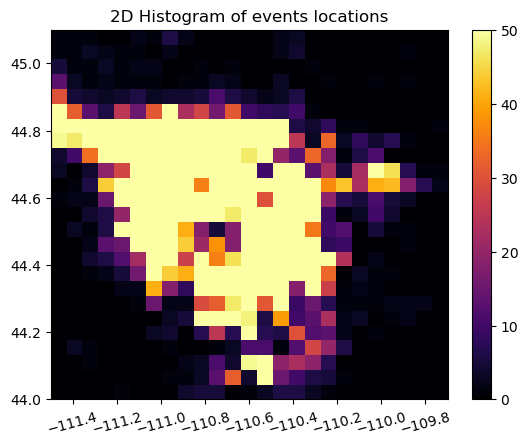

In [95]:
plt.style.use('default')
plt.figure()
a = plt.hist2d(ev_lons,ev_lats,bins=25,range= ([-111.5,-109.7],[44,45.1]),cmap='inferno', vmin=0,vmax=50)
plt.title('2D Histogram of events locations')
plt.xticks(rotation=15)
plt.colorbar()
plt.show()

In [1]:
import pygmt


In [2]:
pygmt.__version__

AttributeError: module 'pygmt' has no attribute '__version__'

In [3]:
pygmt.__version__


AttributeError: module 'pygmt' has no attribute '__version__'